In [1]:
import numpy as np 
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
df = pd.read_csv('Train_Dataset_190184A.csv')

In [3]:
!pip install xgboost

In [4]:
df.head(10)

,customer_id,account_length,location_code,intertiol_plan,voice_mail_plan,number_vm_messages,total_day_min,total_day_calls,total_day_charge,total_eve_min,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,customer_service_calls,Churn
0,1001,15.0,452,no,no,0.0,121.1,130.0,20.59,216.0,86.0,18.36000,235.1,33.0,10.58,16.1,5.0,4.35,2.0,No
1,1002,105.0,452,no,no,0.0,259.3,96.0,44.08,175.2,97.0,14.89000,222.4,36.0,10.01,12.0,5.0,3.24,3.0,No
2,1003,97.0,452,no,yes,32.0,183.4,94.0,31.18,269.1,120.0,22.87000,203.5,38.0,9.16,6.7,4.0,1.81,5.0,No
3,1004,121.0,445,no,yes,35.0,68.7,95.0,11.68,209.2,69.0,17.78000,197.4,42.0,8.88,11.4,4.0,3.08,1.0,No
4,1005,98.0,452,no,yes,22.0,278.3,89.0,47.31,93.4,143.0,7.94000,107.6,42.0,4.84,9.7,5.0,2.62,0.0,No
5,1006,151.0,445,no,yes,17.0,214.7,97.0,36.50,138.5,90.0,11.77000,169.1,44.0,7.61,8.6,4.0,2.32,1.0,No
6,1009,94.0,547,no,no,0.0,262.2,105.0,48.10,216.6,102.0,18.22000,235.6,47.0,9.97,11.5,3.0,3.11,3.0,Yes
7,1010,93.0,547,yes,no,0.0,168.4,114.0,28.63,276.0,127.0,23.46000,196.2,48.0,8.83,11.4,3.0,3.08,1.0,No
8,1012,61.0,445,no,yes,31.0,288.7,101.0,49.08,203.8,102.0,17.17343,203.2,49.0,9.14,8.6,3.0,2.32,0.0,No
9,1013,137.0,547,no,no,0.0,242.1,118.0,41.16,191.0,93.0,16.24000,218.6,50.0,9.84,14.7,2.0,3.97,3.0,No


In [5]:
churn_mapping = {"No": 0, "Yes": 1}
df['Churn'] = df['Churn'].map(churn_mapping)

In [6]:
churn_mapping = {"no": 0, "yes": 1}
df['intertiol_plan'] = df['intertiol_plan'].map(churn_mapping)

In [7]:
churn_mapping = {"no": 0, "yes": 1}
df['voice_mail_plan'] = df['voice_mail_plan'].map(churn_mapping)

In [8]:
df.shape

(2108, 20)

In [9]:
df.describe()

,customer_id,account_length,location_code,intertiol_plan,voice_mail_plan,number_vm_messages,total_day_min,total_day_calls,total_day_charge,total_eve_min,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,customer_service_calls,Churn
count,2108.000000,2108.000000,2108.000000,2108.000000,2108.000000,2108.000000,2108.000000,2108.000000,2108.000000,2108.000000,2108.000000,2108.000000,2108.000000,2108.000000,2108.000000,2108.000000,2108.000000,2108.000000,2108.000000,2108.000000
mean,2163.796015,101.207502,473.766603,0.120019,0.212998,5.722090,183.331799,100.872684,31.138294,202.037815,100.103088,17.173430,201.243495,87.679981,9.055573,10.250997,4.410926,2.774855,1.660655,0.251423
std,670.698743,40.146211,42.175888,0.325061,0.409523,11.314053,56.504982,19.758796,9.636029,49.596054,20.585389,4.203725,48.661122,12.744014,2.187036,2.817393,2.450415,0.736947,1.427303,0.433934
min,1001.000000,1.000000,445.000000,0.000000,0.000000,0.000000,29.500000,45.000000,-25.600000,61.900000,-80.000000,5.260000,65.700000,33.000000,2.960000,-9.300000,0.000000,0.000000,0.000000,0.000000
25%,1579.500000,74.000000,445.000000,0.000000,0.000000,0.000000,145.050000,87.000000,24.715000,167.200000,87.000000,14.250000,168.275000,79.000000,7.570000,8.600000,3.000000,2.320000,1.000000,0.000000
50%,2169.000000,101.207502,452.000000,0.000000,0.000000,0.000000,181.450000,101.500000,30.805000,202.600000,100.000000,17.235000,201.000000,90.000000,9.050000,10.300000,4.000000,2.780000,1.000000,0.000000
75%,2743.250000,126.250000,452.000000,0.000000,0.000000,0.000000,221.725000,115.000000,37.702500,236.850000,114.000000,20.090000,233.800000,98.000000,10.520000,12.000000,6.000000,3.240000,2.000000,1.000000
max,3321.000000,232.000000,547.000000,1.000000,1.000000,35.000000,334.300000,156.000000,58.070000,340.900000,170.000000,30.830000,335.700000,105.000000,15.060000,18.300000,20.000000,4.940000,9.000000,1.000000


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2108 entries, 0 to 2107
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   customer_id             2108 non-null   int64  
 1   account_length          2108 non-null   float64
 2   location_code           2108 non-null   int64  
 3   intertiol_plan          2108 non-null   int64  
 4   voice_mail_plan         2108 non-null   int64  
 5   number_vm_messages      2108 non-null   float64
 6   total_day_min           2108 non-null   float64
 7   total_day_calls         2108 non-null   float64
 8   total_day_charge        2108 non-null   float64
 9   total_eve_min           2108 non-null   float64
 10  total_eve_calls         2108 non-null   float64
 11  total_eve_charge        2108 non-null   float64
 12  total_night_minutes     2108 non-null   float64
 13  total_night_calls       2108 non-null   float64
 14  total_night_charge      2108 non-null   

In [11]:
df.columns

Index(['customer_id', 'account_length', 'location_code', 'intertiol_plan',
       'voice_mail_plan', 'number_vm_messages', 'total_day_min',
       'total_day_calls', 'total_day_charge', 'total_eve_min',
       'total_eve_calls', 'total_eve_charge', 'total_night_minutes',
       'total_night_calls', 'total_night_charge', 'total_intl_minutes',
       'total_intl_calls', 'total_intl_charge', 'customer_service_calls',
       'Churn'],
      dtype='object')

In [12]:
metric_col=['account_length', 'location_code', 'number_vm_messages', 'total_day_min',
       'total_day_calls', 'total_day_charge', 'total_eve_min',
       'total_eve_calls', 'total_eve_charge', 'total_night_minutes',
       'total_night_calls', 'total_night_charge', 'total_intl_minutes',
       'total_intl_calls', 'total_intl_charge', 'customer_service_calls']

In [13]:
categorical_col=['intertiol_plan','voice_mail_plan']

# DDA

In [14]:
df[metric_col].describe()

,account_length,location_code,number_vm_messages,total_day_min,total_day_calls,total_day_charge,total_eve_min,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,customer_service_calls
count,2108.000000,2108.000000,2108.000000,2108.000000,2108.000000,2108.000000,2108.000000,2108.000000,2108.000000,2108.000000,2108.000000,2108.000000,2108.000000,2108.000000,2108.000000,2108.000000
mean,101.207502,473.766603,5.722090,183.331799,100.872684,31.138294,202.037815,100.103088,17.173430,201.243495,87.679981,9.055573,10.250997,4.410926,2.774855,1.660655
std,40.146211,42.175888,11.314053,56.504982,19.758796,9.636029,49.596054,20.585389,4.203725,48.661122,12.744014,2.187036,2.817393,2.450415,0.736947,1.427303
min,1.000000,445.000000,0.000000,29.500000,45.000000,-25.600000,61.900000,-80.000000,5.260000,65.700000,33.000000,2.960000,-9.300000,0.000000,0.000000,0.000000
25%,74.000000,445.000000,0.000000,145.050000,87.000000,24.715000,167.200000,87.000000,14.250000,168.275000,79.000000,7.570000,8.600000,3.000000,2.320000,1.000000
50%,101.207502,452.000000,0.000000,181.450000,101.500000,30.805000,202.600000,100.000000,17.235000,201.000000,90.000000,9.050000,10.300000,4.000000,2.780000,1.000000
75%,126.250000,452.000000,0.000000,221.725000,115.000000,37.702500,236.850000,114.000000,20.090000,233.800000,98.000000,10.520000,12.000000,6.000000,3.240000,2.000000
max,232.000000,547.000000,35.000000,334.300000,156.000000,58.070000,340.900000,170.000000,30.830000,335.700000,105.000000,15.060000,18.300000,20.000000,4.940000,9.000000


<AxesSubplot:xlabel='Churn', ylabel='count'>

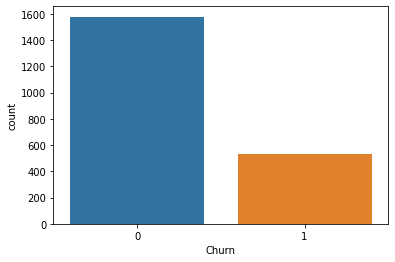

In [15]:
sns.countplot(x=df.Churn)

<AxesSubplot:xlabel='Churn', ylabel='count'>

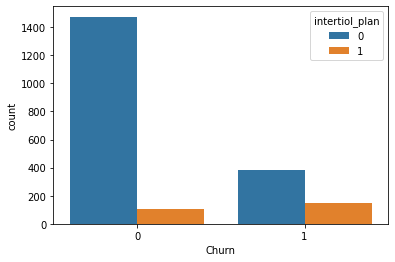

In [16]:
sns.countplot(x='Churn', data=df, hue='intertiol_plan')

<AxesSubplot:xlabel='Churn', ylabel='count'>

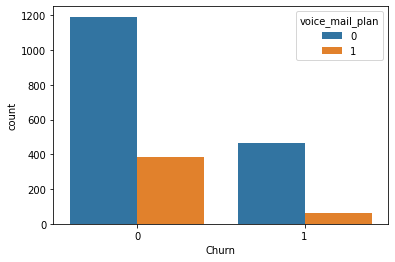

In [17]:
sns.countplot(x='Churn', data=df, hue='voice_mail_plan')

<AxesSubplot:xlabel='Churn', ylabel='count'>

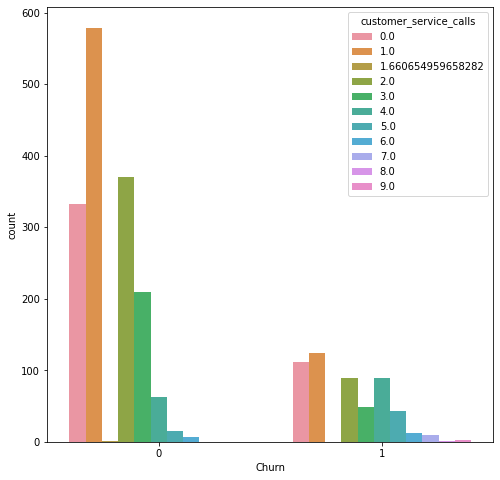

In [18]:
plt.figure(figsize=(8,8))
sns.countplot(x='Churn', data=df, hue='customer_service_calls')

<AxesSubplot:xlabel='customer_service_calls', ylabel='Density'>

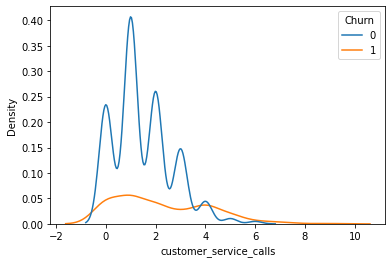

In [19]:
sns.kdeplot(data=df, x='customer_service_calls', hue='Churn')

<AxesSubplot:xlabel='account_length', ylabel='Count'>

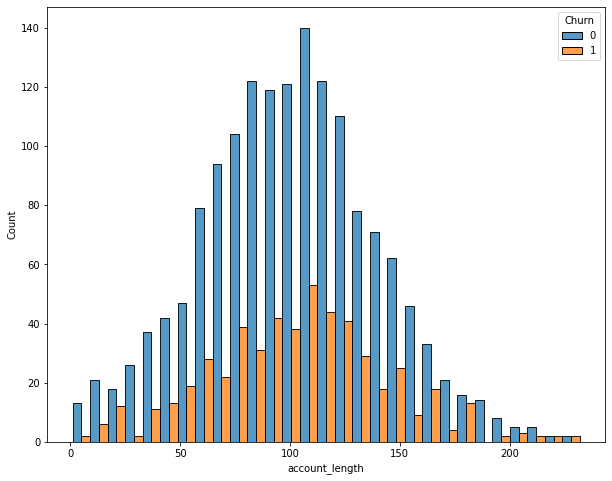

In [20]:
plt.figure(figsize=(10,8))
sns.histplot(x = 'account_length', hue = 'Churn', data = df, multiple='dodge')

([<matplotlib.patches.Wedge at 0x18b7b7207f0>,
 [Text(-0.862781930907908, 0.6823542626076443, '0'),
  Text(0.8627819628512157, -0.6823542222179063, '1')])

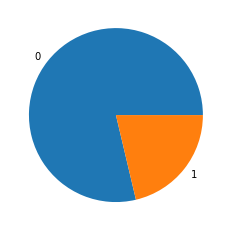

In [21]:
plt.pie(df['voice_mail_plan'].value_counts(), labels=df['voice_mail_plan'].unique().tolist())

In [22]:
df.columns

Index(['customer_id', 'account_length', 'location_code', 'intertiol_plan',
       'voice_mail_plan', 'number_vm_messages', 'total_day_min',
       'total_day_calls', 'total_day_charge', 'total_eve_min',
       'total_eve_calls', 'total_eve_charge', 'total_night_minutes',
       'total_night_calls', 'total_night_charge', 'total_intl_minutes',
       'total_intl_calls', 'total_intl_charge', 'customer_service_calls',
       'Churn'],
      dtype='object')

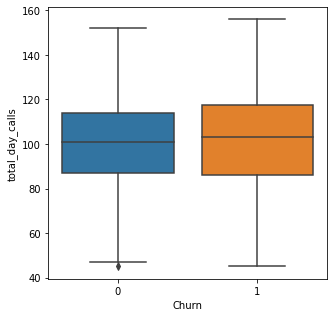

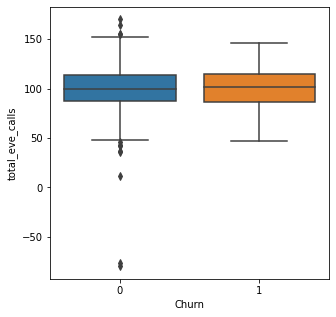

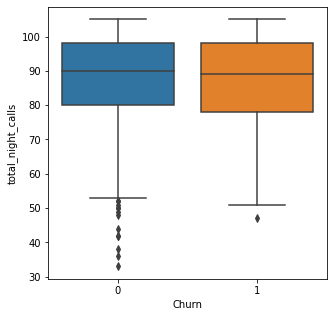

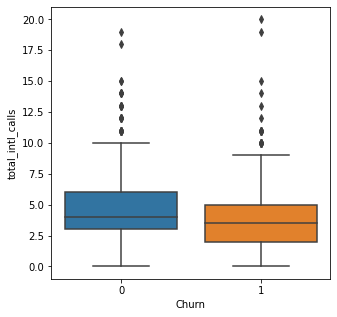

In [23]:
#cols=['account_length', 'total_day_charge', 'total_eve_charge', 'total_night_charge', 'total_intl_charge']
cols=[ 'total_day_calls',
       'total_eve_calls',
       'total_night_calls',
       'total_intl_calls']
for col in cols:
    plt.figure(figsize=(5,5))
    sns.boxplot(x="Churn", y=col, data=df)
    plt.show()

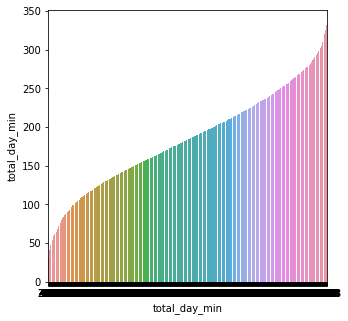

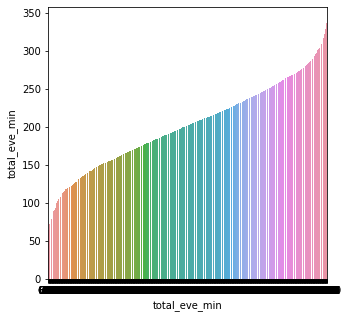

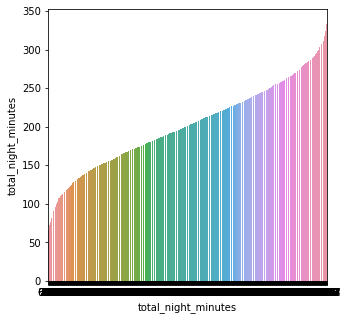

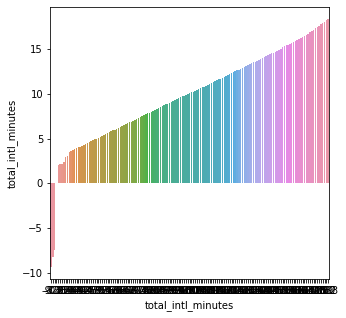

In [24]:
cols=['total_day_min', 'total_eve_min','total_night_minutes', 'total_intl_minutes']
for col in cols:
    plt.figure(figsize=(5,5))
    sns.barplot(y=col, x=col,data=df)
    plt.show()

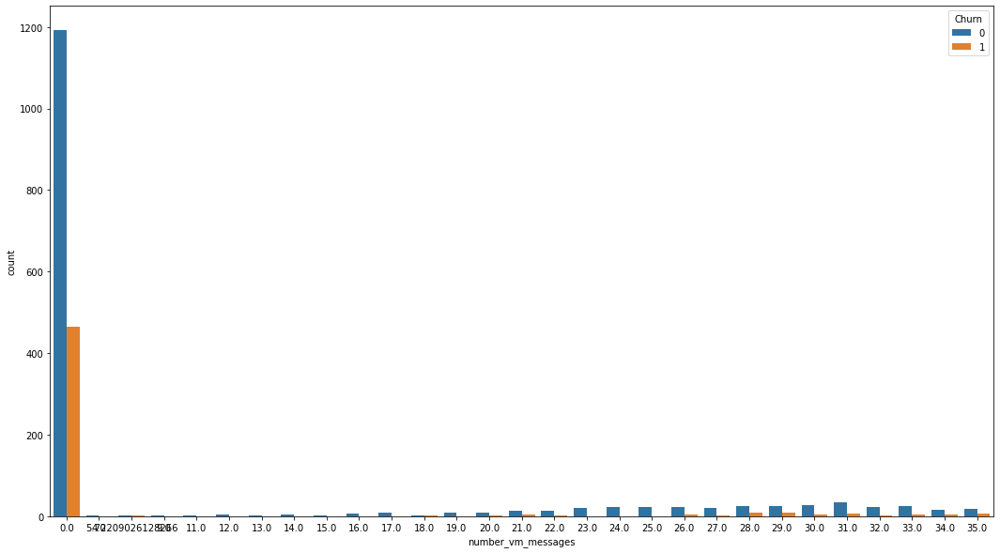

In [25]:
cols=['number_vm_messages']
for col in cols:
    plt.figure(figsize=(18,10))
    sns.countplot(x=col, data=df, hue='Churn')
    plt.show()

In [26]:
sns.countplot(x=['total_day_calls', 'total_eve_calls'], data=df)

ValueError: The truth value of a Series is ambiguous. Use a.empty, a.bool(), a.item(), a.any() or a.all().

# EDA

In [27]:
metric_col=['account_length', 'location_code', 'number_vm_messages', 'total_day_min',
       'total_day_calls', 'total_day_charge', 'total_eve_min',
       'total_eve_calls', 'total_eve_charge', 'total_night_minutes',
       'total_night_calls', 'total_night_charge', 'total_intl_minutes',
       'total_intl_calls', 'total_intl_charge', 'customer_service_calls']

In [28]:
df.columns.difference(['customer_id','intertiol_plan','voice_mail_plan'])

Index(['Churn', 'account_length', 'customer_service_calls', 'location_code',
       'number_vm_messages', 'total_day_calls', 'total_day_charge',
       'total_day_min', 'total_eve_calls', 'total_eve_charge', 'total_eve_min',
       'total_intl_calls', 'total_intl_charge', 'total_intl_minutes',
       'total_night_calls', 'total_night_charge', 'total_night_minutes'],
      dtype='object')

In [29]:

#plt.title("Number of diabetic(1) and non-diabetic(0) females in the dataset")

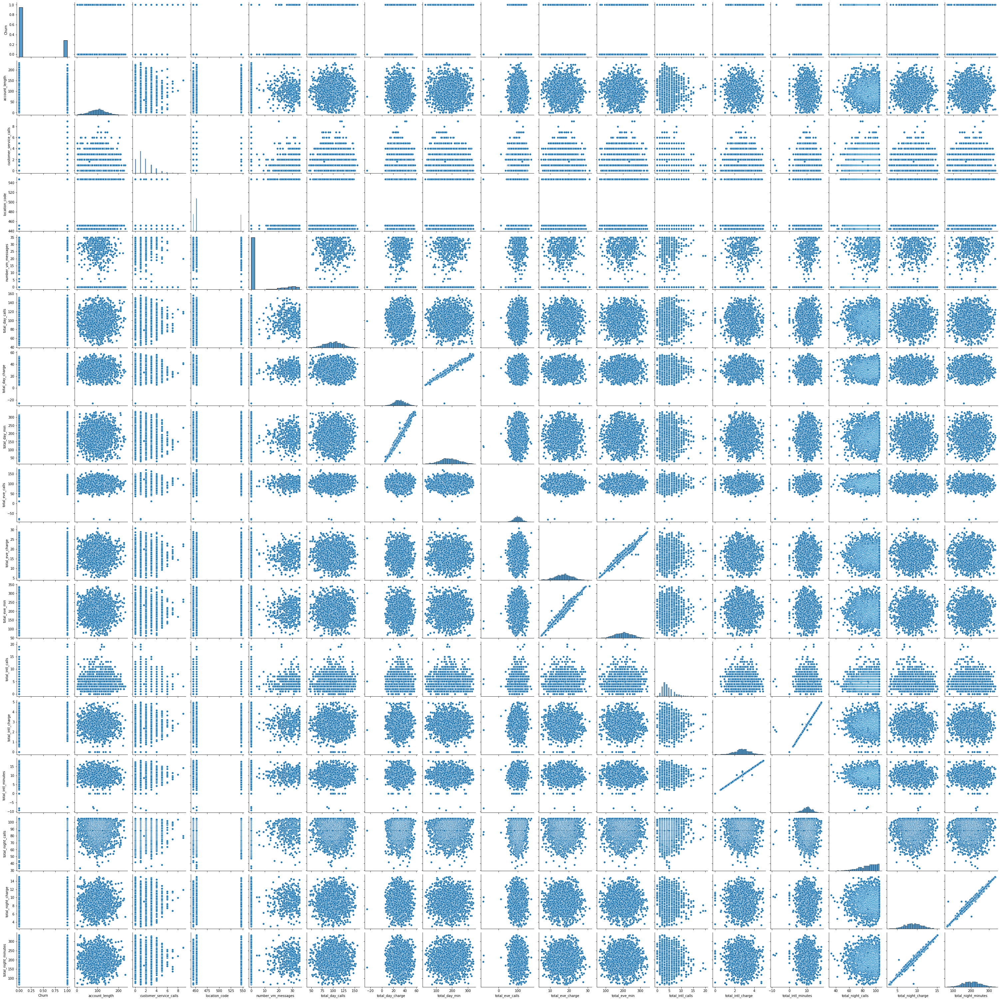

In [30]:
sns.pairplot(df[df.columns.difference(['customer_id','intertiol_plan','voice_mail_plan'])])
plt.show()

#### Numerical

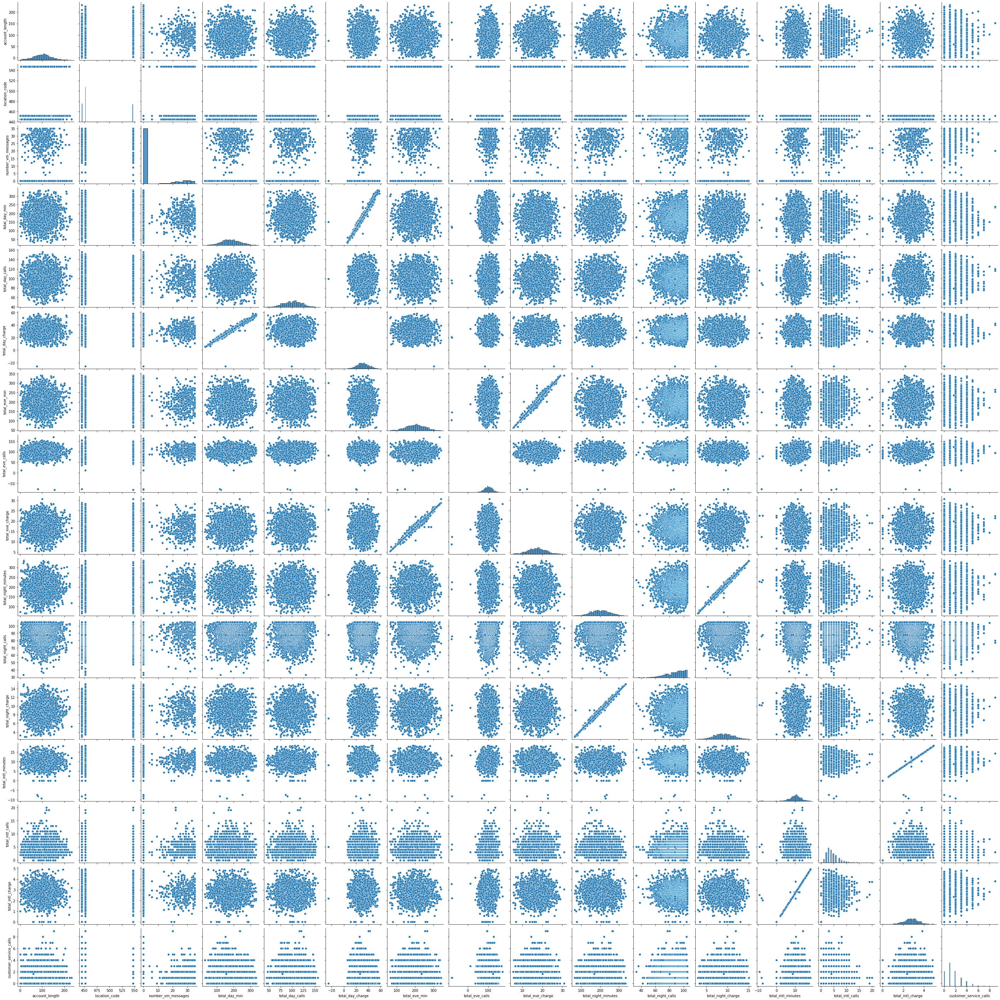

In [31]:
sns.pairplot(df[metric_col])
plt.show()

In [32]:
#

In [33]:
df.columns

Index(['customer_id', 'account_length', 'location_code', 'intertiol_plan',
       'voice_mail_plan', 'number_vm_messages', 'total_day_min',
       'total_day_calls', 'total_day_charge', 'total_eve_min',
       'total_eve_calls', 'total_eve_charge', 'total_night_minutes',
       'total_night_calls', 'total_night_charge', 'total_intl_minutes',
       'total_intl_calls', 'total_intl_charge', 'customer_service_calls',
       'Churn'],
      dtype='object')

#### Catergorical

<AxesSubplot:xlabel='intertiol_plan', ylabel='count'>

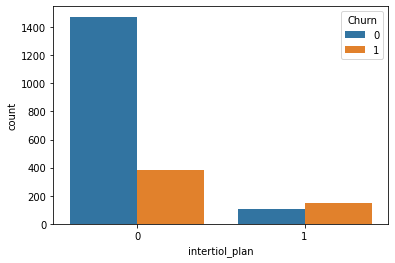

In [34]:
sns.countplot(x="intertiol_plan", hue="Churn", data=df)

<AxesSubplot:xlabel='voice_mail_plan', ylabel='count'>

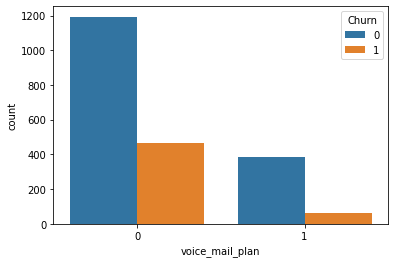

In [35]:
sns.countplot(x="voice_mail_plan", hue="Churn", data=df)

#### Pearson correlation

In [36]:
df_corr = df.corr().transpose()
df_corr

,customer_id,account_length,location_code,intertiol_plan,voice_mail_plan,number_vm_messages,total_day_min,total_day_calls,total_day_charge,total_eve_min,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,customer_service_calls,Churn
customer_id,1.000000,0.003499,-0.016468,0.020756,0.025319,0.028776,0.022689,-0.009930,0.019176,-0.012927,0.048507,-0.012228,0.006440,0.964250,0.005683,0.018124,0.007329,0.013637,-0.041100,-0.019756
account_length,0.003499,1.000000,-0.033747,0.032714,0.009441,0.001057,-0.006051,0.025051,-0.002341,0.001239,0.032570,-0.000643,-0.033695,0.004645,-0.034143,-0.014669,0.006158,-0.019263,-0.002506,0.026678
location_code,-0.016468,-0.033747,1.000000,0.058403,0.015712,0.015106,-0.019725,-0.022603,-0.018727,0.006807,-0.034533,0.012082,0.000074,-0.009774,0.000451,-0.005578,-0.032196,-0.009997,0.030821,-0.005402
intertiol_plan,0.020756,0.032714,0.058403,1.000000,-0.010298,-0.012736,0.040701,-0.037153,0.044132,0.013434,0.027876,0.013810,-0.046240,0.021993,-0.049643,0.087244,-0.011896,0.088544,-0.065618,0.287312
voice_mail_plan,0.025319,0.009441,0.015712,-0.010298,1.000000,0.971216,-0.019462,-0.010255,-0.018271,-0.005624,0.008203,-0.006292,0.001004,0.025224,0.003928,0.018677,0.014144,0.016237,-0.002139,-0.130570
number_vm_messages,0.028776,0.001057,0.015106,-0.012736,0.971216,1.000000,-0.013819,-0.010277,-0.012660,-0.000061,0.003937,-0.000816,0.007223,0.026613,0.009598,0.021050,0.018391,0.018760,0.007157,-0.117093
total_day_min,0.022689,-0.006051,-0.019725,0.040701,-0.019462,-0.013819,1.000000,0.011266,0.988139,0.048371,0.029273,0.048307,0.005337,0.015581,0.002462,-0.007731,0.004527,-0.006680,-0.097458,0.234694
total_day_calls,-0.009930,0.025051,-0.022603,-0.037153,-0.010255,-0.010277,0.011266,1.000000,0.012058,0.020811,0.015882,0.021525,0.014824,-0.017887,0.014543,-0.000494,0.018012,-0.001269,-0.002476,0.032844
total_day_charge,0.019176,-0.002341,-0.018727,0.044132,-0.018271,-0.012660,0.988139,0.012058,1.000000,0.039477,0.032296,0.039090,0.007237,0.015367,0.003825,-0.007616,0.002022,-0.007821,-0.093912,0.233453
total_eve_min,-0.012927,0.001239,0.006807,0.013434,-0.005624,-0.000061,0.048371,0.020811,0.039477,1.000000,0.040096,0.993530,0.000230,-0.005702,0.000772,0.000280,0.029788,0.004876,-0.047700,0.084591


<AxesSubplot:>

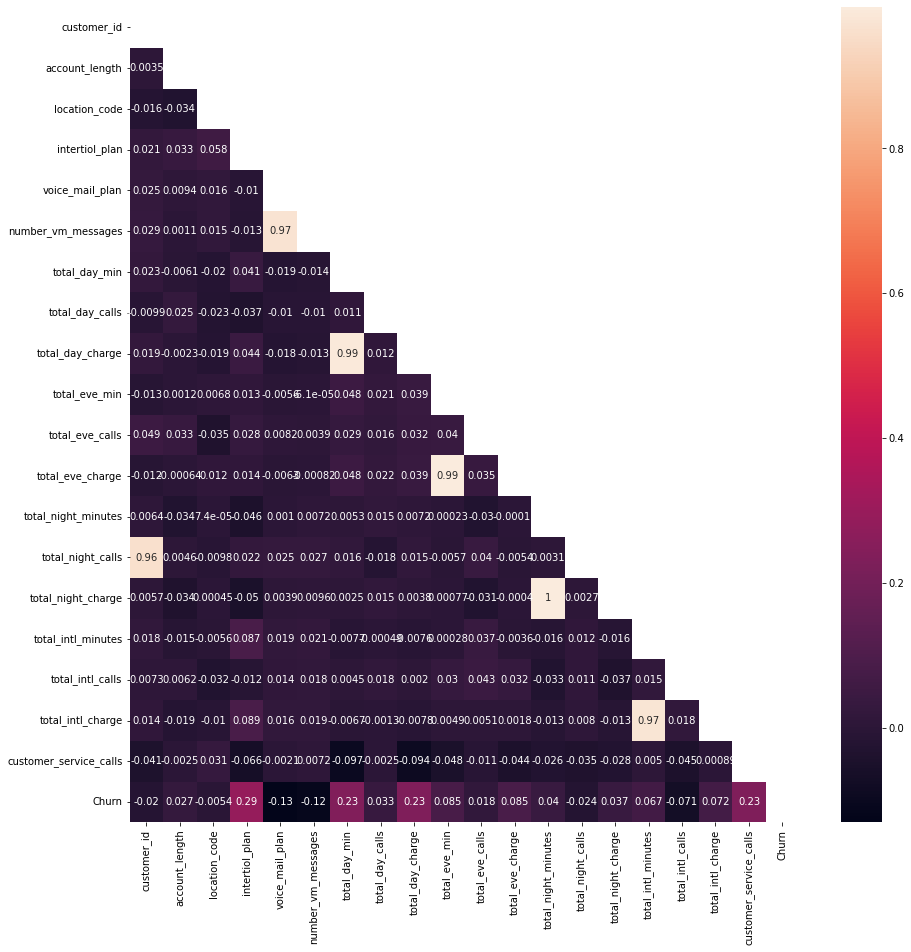

In [37]:
plt.figure(figsize=(15,15))
mask = np.triu(np.ones_like(df_corr))
sns.heatmap(df_corr,mask=mask, annot=True)

<AxesSubplot:xlabel='number_vm_messages', ylabel='voice_mail_plan'>

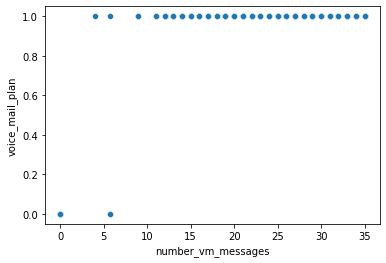

In [38]:
sns.scatterplot(x='number_vm_messages', y='voice_mail_plan', data=df)

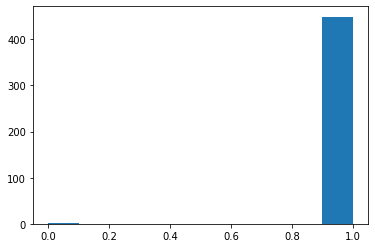

In [39]:
plt.hist(df[df['number_vm_messages']!=0]['voice_mail_plan'])

plt.show()

In [40]:
df.head()

,customer_id,account_length,location_code,intertiol_plan,voice_mail_plan,number_vm_messages,total_day_min,total_day_calls,total_day_charge,total_eve_min,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,customer_service_calls,Churn
0,1001,15.0,452,0,0,0.0,121.1,130.0,20.59,216.0,86.0,18.36,235.1,33.0,10.58,16.1,5.0,4.35,2.0,0
1,1002,105.0,452,0,0,0.0,259.3,96.0,44.08,175.2,97.0,14.89,222.4,36.0,10.01,12.0,5.0,3.24,3.0,0
2,1003,97.0,452,0,1,32.0,183.4,94.0,31.18,269.1,120.0,22.87,203.5,38.0,9.16,6.7,4.0,1.81,5.0,0
3,1004,121.0,445,0,1,35.0,68.7,95.0,11.68,209.2,69.0,17.78,197.4,42.0,8.88,11.4,4.0,3.08,1.0,0
4,1005,98.0,452,0,1,22.0,278.3,89.0,47.31,93.4,143.0,7.94,107.6,42.0,4.84,9.7,5.0,2.62,0.0,0


#### Spearman’s rank correlation

In [41]:
df_corr_sp = df.corr(method="spearman").transpose()
df_corr_sp

,customer_id,account_length,location_code,intertiol_plan,voice_mail_plan,number_vm_messages,total_day_min,total_day_calls,total_day_charge,total_eve_min,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,customer_service_calls,Churn
customer_id,1.000000,0.005786,0.001882,0.020664,0.025267,0.025733,0.024401,-0.016426,0.024756,-0.011174,0.039802,-0.009868,0.001111,0.997012,0.001724,0.013849,0.017175,0.013962,-0.036548,-0.019761
account_length,0.005786,1.000000,-0.042353,0.033578,0.015220,0.009034,-0.000089,0.021906,0.002960,-0.001640,0.026328,-0.002694,-0.045777,0.007869,-0.046541,-0.011929,0.007763,-0.013102,-0.003412,0.024851
location_code,0.001882,-0.042353,1.000000,0.049956,0.018347,0.019915,-0.006186,-0.012873,-0.006245,-0.011221,-0.027457,-0.006989,0.035926,0.004158,0.037173,0.013072,-0.021072,0.012799,0.028194,-0.016949
intertiol_plan,0.020664,0.033578,0.049956,1.000000,-0.010298,-0.012667,0.047924,-0.023719,0.052232,0.003308,0.023723,0.004750,-0.049851,0.018972,-0.052750,0.089035,-0.035770,0.090944,-0.078435,0.287312
voice_mail_plan,0.025267,0.015220,0.018347,-0.010298,1.000000,0.988856,-0.014495,-0.014440,-0.015029,0.000609,0.002649,-0.000192,0.001005,0.028559,0.003036,0.018902,0.002706,0.019783,-0.005337,-0.130570
number_vm_messages,0.025733,0.009034,0.019915,-0.012667,0.988856,1.000000,-0.012165,-0.016734,-0.012747,0.004724,0.000044,0.003011,0.003267,0.029044,0.005452,0.020316,0.003721,0.021121,0.001435,-0.122425
total_day_min,0.024401,-0.000089,-0.006186,0.047924,-0.014495,-0.012165,1.000000,0.019562,0.995352,0.059337,0.024620,0.058110,0.002585,0.022969,-0.000217,-0.014301,0.017337,-0.011970,-0.088050,0.209113
total_day_calls,-0.016426,0.021906,-0.012873,-0.023719,-0.014440,-0.016734,0.019562,1.000000,0.021660,0.029338,0.010739,0.030246,0.014819,-0.015328,0.014430,-0.009335,0.015285,-0.009301,-0.008106,0.038548
total_day_charge,0.024756,0.002960,-0.006245,0.052232,-0.015029,-0.012747,0.995352,0.021660,1.000000,0.056012,0.024888,0.055131,0.000964,0.024810,-0.002118,-0.014336,0.015425,-0.012972,-0.089642,0.209522
total_eve_min,-0.011174,-0.001640,-0.011221,0.003308,0.000609,0.004724,0.059337,0.029338,0.056012,1.000000,0.031451,0.992849,0.003045,-0.013434,0.004962,0.006570,0.033803,0.008573,-0.047851,0.082712


<AxesSubplot:>

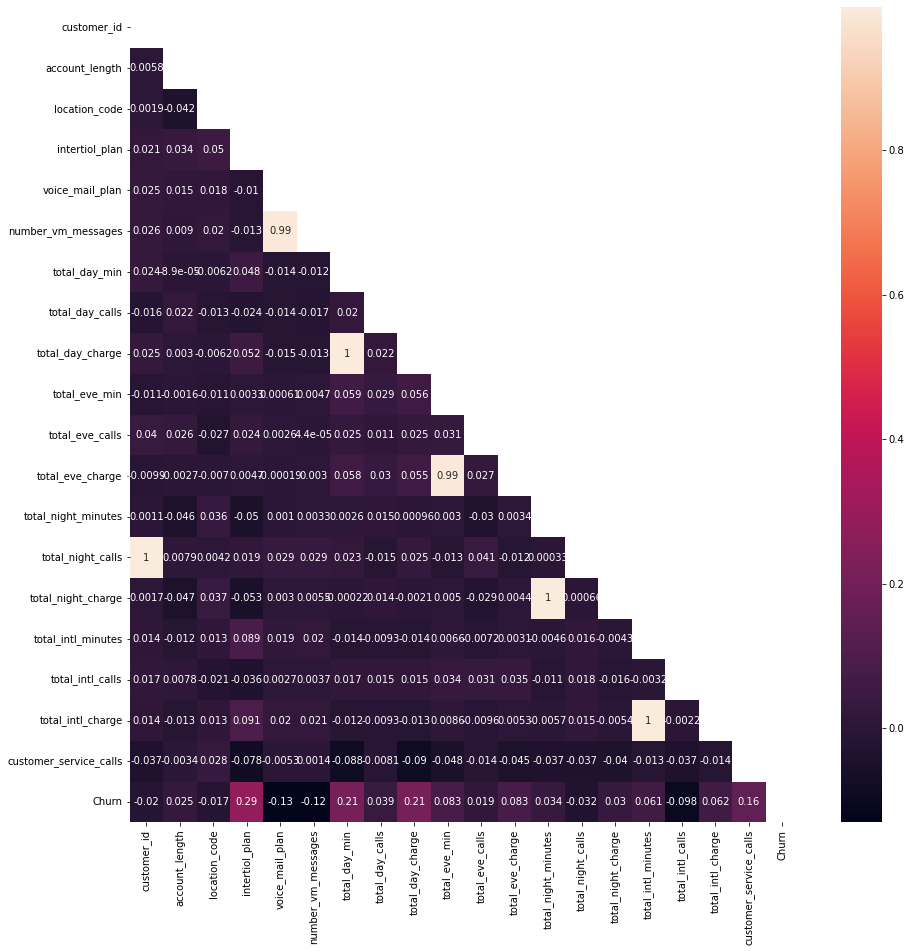

In [42]:
plt.figure(figsize=(15,15))
mask = np.triu(np.ones_like(df_corr_sp))
sns.heatmap(df_corr_sp,mask=mask, annot=True)

In [43]:
df['total_charge']= df['total_intl_charge']+df['total_night_charge']+df['total_eve_charge']+df['total_day_charge']
#df_test['total_charge']= df_test['total_intl_charge']+df_test['total_night_charge']+df_test['total_eve_charge']+df_test['total_day_charge']

In [44]:
df.head()

,customer_id,account_length,location_code,intertiol_plan,voice_mail_plan,number_vm_messages,total_day_min,total_day_calls,total_day_charge,total_eve_min,...,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,customer_service_calls,Churn,total_charge
0,1001,15.0,452,0,0,0.0,121.1,130.0,20.59,216.0,...,18.36,235.1,33.0,10.58,16.1,5.0,4.35,2.0,0,53.88
1,1002,105.0,452,0,0,0.0,259.3,96.0,44.08,175.2,...,14.89,222.4,36.0,10.01,12.0,5.0,3.24,3.0,0,72.22
2,1003,97.0,452,0,1,32.0,183.4,94.0,31.18,269.1,...,22.87,203.5,38.0,9.16,6.7,4.0,1.81,5.0,0,65.02
3,1004,121.0,445,0,1,35.0,68.7,95.0,11.68,209.2,...,17.78,197.4,42.0,8.88,11.4,4.0,3.08,1.0,0,41.42
4,1005,98.0,452,0,1,22.0,278.3,89.0,47.31,93.4,...,7.94,107.6,42.0,4.84,9.7,5.0,2.62,0.0,0,62.71


In [45]:
df['total_calls']= df['total_intl_calls']+df['total_night_calls']+df['total_eve_calls']+df['total_day_calls']
#df_test['total_calls']= df_test['total_intl_calls']+df_test['total_night_calls']+df_test['total_eve_calls']+df_test['total_day_calls']

In [46]:
df['total_min']= df['total_intl_minutes']+df['total_night_minutes']+df['total_eve_min']+df['total_day_min']
#df_test['total_min']= df_test['total_intl_minutes']+df_test['total_night_minutes']+df_test['total_eve_min']+df_test['total_day_min']

In [47]:
df["total_no_of_plans"] = df['intertiol_plan']+df['voice_mail_plan']
#df_test['no_of_plans'] =df_test['intertiol_plan']+df_test['voice_mail_plan']

In [48]:
df.head()

,customer_id,account_length,location_code,intertiol_plan,voice_mail_plan,number_vm_messages,total_day_min,total_day_calls,total_day_charge,total_eve_min,...,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,customer_service_calls,Churn,total_charge,total_calls,total_min,total_no_of_plans
0,1001,15.0,452,0,0,0.0,121.1,130.0,20.59,216.0,...,10.58,16.1,5.0,4.35,2.0,0,53.88,254.0,588.3,0
1,1002,105.0,452,0,0,0.0,259.3,96.0,44.08,175.2,...,10.01,12.0,5.0,3.24,3.0,0,72.22,234.0,668.9,0
2,1003,97.0,452,0,1,32.0,183.4,94.0,31.18,269.1,...,9.16,6.7,4.0,1.81,5.0,0,65.02,256.0,662.7,1
3,1004,121.0,445,0,1,35.0,68.7,95.0,11.68,209.2,...,8.88,11.4,4.0,3.08,1.0,0,41.42,210.0,486.7,1
4,1005,98.0,452,0,1,22.0,278.3,89.0,47.31,93.4,...,4.84,9.7,5.0,2.62,0.0,0,62.71,279.0,489.0,1


In [49]:
df_corr = df.corr().transpose()
df_corr

,customer_id,account_length,location_code,intertiol_plan,voice_mail_plan,number_vm_messages,total_day_min,total_day_calls,total_day_charge,total_eve_min,...,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,customer_service_calls,Churn,total_charge,total_calls,total_min,total_no_of_plans
customer_id,1.000000,0.003499,-0.016468,0.020756,0.025319,0.028776,0.022689,-0.009930,0.019176,-0.012927,...,0.005683,0.018124,0.007329,0.013637,-0.041100,-0.019756,0.014285,0.411582,0.011020,0.032901
account_length,0.003499,1.000000,-0.033747,0.032714,0.009441,0.001057,-0.006051,0.025051,-0.002341,0.001239,...,-0.034143,-0.014669,0.006158,-0.019263,-0.002506,0.026678,-0.010461,0.038925,-0.021499,0.027873
location_code,-0.016468,-0.033747,1.000000,0.058403,0.015712,0.015106,-0.019725,-0.022603,-0.018727,0.006807,...,0.000451,-0.005578,-0.032196,-0.009997,0.030821,-0.005402,-0.012470,-0.042730,-0.008649,0.048862
intertiol_plan,0.020756,0.032714,0.058403,1.000000,-0.010298,-0.012736,0.040701,-0.037153,0.044132,0.013434,...,-0.049643,0.087244,-0.011896,0.088544,-0.065618,0.287312,0.040330,0.002853,0.010542,0.616742
voice_mail_plan,0.025319,0.009441,0.015712,-0.010298,1.000000,0.971216,-0.019462,-0.010255,-0.018271,-0.005624,...,0.003928,0.018677,0.014144,0.016237,-0.002139,-0.130570,-0.016678,0.010121,-0.013999,0.780772
number_vm_messages,0.028776,0.001057,0.015106,-0.012736,0.971216,1.000000,-0.013819,-0.010277,-0.012660,-0.000061,...,0.009598,0.021050,0.018391,0.018760,0.007157,-0.117093,-0.008305,0.008232,-0.004089,0.756590
total_day_min,0.022689,-0.006051,-0.019725,0.040701,-0.019462,-0.013819,1.000000,0.011266,0.988139,0.048371,...,0.002462,-0.007731,0.004527,-0.006680,-0.097458,0.234694,0.891407,0.032492,0.648259,0.010112
total_day_calls,-0.009930,0.025051,-0.022603,-0.037153,-0.010255,-0.010277,0.011266,1.000000,0.012058,0.020811,...,0.014543,-0.000494,0.018012,-0.001269,-0.002476,0.032844,0.021773,0.624872,0.026183,-0.031288
total_day_charge,0.019176,-0.002341,-0.018727,0.044132,-0.018271,-0.012660,0.988139,0.012058,1.000000,0.039477,...,0.003825,-0.007616,0.002022,-0.007821,-0.093912,0.233453,0.898528,0.034659,0.637094,0.013193
total_eve_min,-0.012927,0.001239,0.006807,0.013434,-0.005624,-0.000061,0.048371,0.020811,0.039477,1.000000,...,0.000772,0.000280,0.029788,0.004876,-0.047700,0.084591,0.418168,0.038836,0.573716,0.003967


<AxesSubplot:>

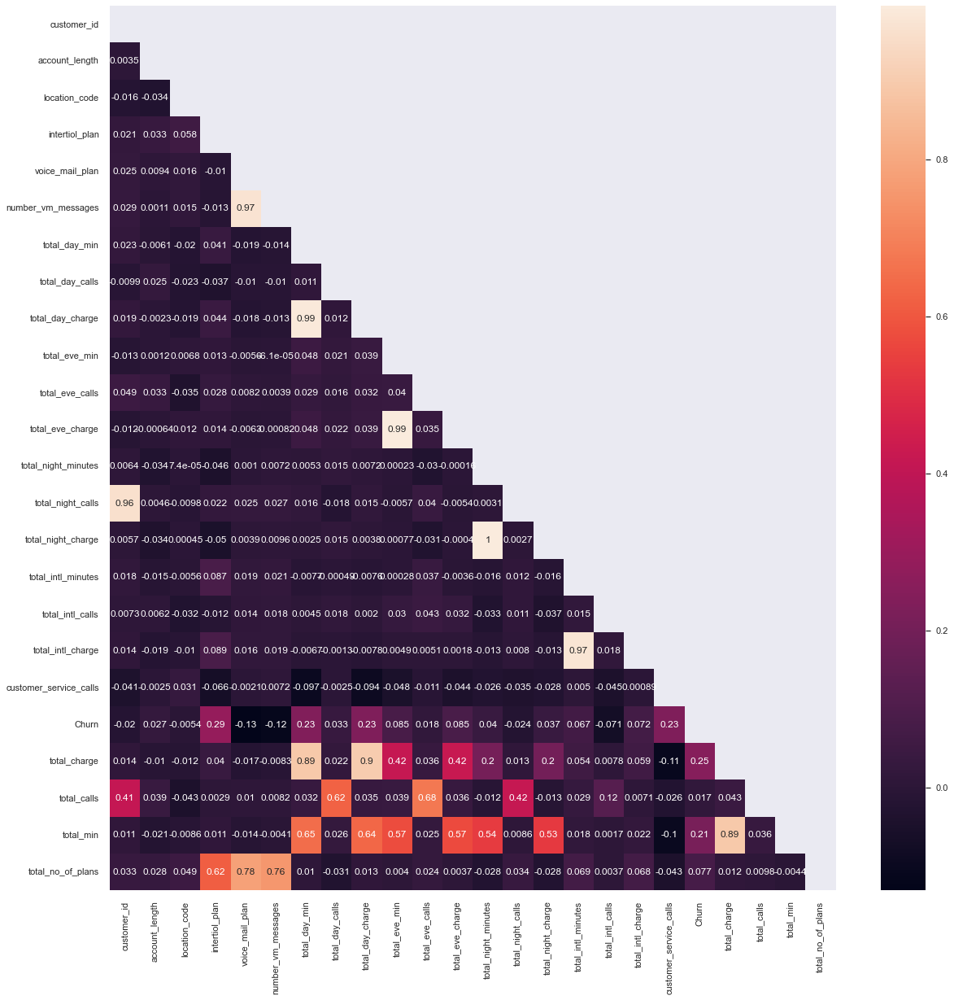

In [83]:
plt.figure(figsize=(20,20))
mask = np.triu(np.ones_like(df_corr))
sns.heatmap(df_corr,mask=mask, annot=True)

In [51]:
def feature_importance(dataframe,features,target,model):
    model.fit(dataframe[features],dataframe[target])
    impos = model.coef_[0]
    for i,v in enumerate(impos):
        print('%0d Feature: %s   , Score: %.5f' % (i,features[i],v))

    plt.bar([str(features[x]) for x in range(len(impos))], impos)
    plt.xticks(rotation=90)
    plt.show()

In [52]:
from sklearn.ensemble import RandomForestClassifier
#%%
def feature_importance_trees(dataframe,features,target,model):
    model.fit(dataframe[features],dataframe[target])
    impos = model.feature_importances_
    for i,v in enumerate(impos):
        print('%0d Feature: %s   , Score: %.5f' % (i,features[i],v))

    plt.bar([x for x in range(len(impos))], impos)
    plt.xticks(rotation=90)
    plt.show()

In [53]:
from sklearn.inspection import permutation_importance

In [54]:
def feature_importance_permutation(dataframe,features,target,model):
    model.fit(dataframe[features],dataframe[target])
    results = permutation_importance(model,dataframe[features],dataframe[target], scoring='accuracy')
    impos = results.importances_mean
    for i,v in enumerate(impos):
        print('%0d Feature: %s   , Score: %.5f' % (i,features[i],v))

    plt.bar([x for x in range(len(impos))], impos)
   
    plt.xticks(rotation=90)
    plt.show()

#cols =[        'account_length',         'intertiol_plan',
              'voice_mail_plan',     'number_vm_messages',
                'total_day_min',        'total_day_calls',
             'total_day_charge',          'total_eve_min',
              'total_eve_calls',       'total_eve_charge',
          'total_night_minutes',      'total_night_calls',
           'total_night_charge',     'total_intl_minutes',
             'total_intl_calls',      'total_intl_charge',
       'customer_service_calls',]


In [55]:
cols =[        'account_length',         'intertiol_plan',
              'voice_mail_plan',     'number_vm_messages',
                'total_day_min',        'total_day_calls',
             'total_day_charge',          'total_eve_min',
              'total_eve_calls',       'total_eve_charge',
          'total_night_minutes',      'total_night_calls',
           'total_night_charge',     'total_intl_minutes',
             'total_intl_calls',      'total_intl_charge',
       'customer_service_calls',                  
     'total_charge',
                  'total_calls',              'total_min',
                  'total_no_of_plans']

0 Feature: account_length   , Score: 0.02194
1 Feature: intertiol_plan   , Score: 0.07139
2 Feature: voice_mail_plan   , Score: 0.02433
3 Feature: number_vm_messages   , Score: 0.02838
4 Feature: total_day_min   , Score: 0.06959
5 Feature: total_day_calls   , Score: 0.01996
6 Feature: total_day_charge   , Score: 0.08249
7 Feature: total_eve_min   , Score: 0.02423
8 Feature: total_eve_calls   , Score: 0.01664
9 Feature: total_eve_charge   , Score: 0.02781
10 Feature: total_night_minutes   , Score: 0.02163
11 Feature: total_night_calls   , Score: 0.01629
12 Feature: total_night_charge   , Score: 0.02283
13 Feature: total_intl_minutes   , Score: 0.02858
14 Feature: total_intl_calls   , Score: 0.03448
15 Feature: total_intl_charge   , Score: 0.03306
16 Feature: customer_service_calls   , Score: 0.15468
17 Feature: total_charge   , Score: 0.18513
18 Feature: total_calls   , Score: 0.02079
19 Feature: total_min   , Score: 0.07424
20 Feature: total_no_of_plans   , Score: 0.02151


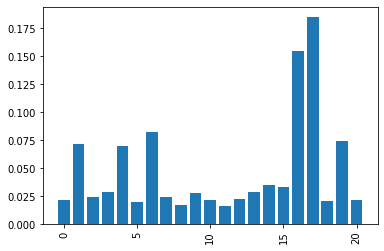

In [56]:
feature_importance_trees(dataframe=df,features=cols,target='Churn',model=RandomForestClassifier())

In [57]:
from sklearn.neighbors import KNeighborsClassifier

0 Feature: account_length   , Score: 0.02514
1 Feature: intertiol_plan   , Score: 0.00000
2 Feature: voice_mail_plan   , Score: -0.00019
3 Feature: number_vm_messages   , Score: 0.00427
4 Feature: total_day_min   , Score: 0.09649
5 Feature: total_day_calls   , Score: 0.00863
6 Feature: total_day_charge   , Score: 0.00104
7 Feature: total_eve_min   , Score: 0.03188
8 Feature: total_eve_calls   , Score: 0.00930
9 Feature: total_eve_charge   , Score: 0.00038
10 Feature: total_night_minutes   , Score: 0.03909
11 Feature: total_night_calls   , Score: 0.00285
12 Feature: total_night_charge   , Score: -0.00028
13 Feature: total_intl_minutes   , Score: -0.00085
14 Feature: total_intl_calls   , Score: 0.00028
15 Feature: total_intl_charge   , Score: -0.00009
16 Feature: customer_service_calls   , Score: 0.00104
17 Feature: total_charge   , Score: 0.00228
18 Feature: total_calls   , Score: 0.01632
19 Feature: total_min   , Score: 0.13065
20 Feature: total_no_of_plans   , Score: -0.00028


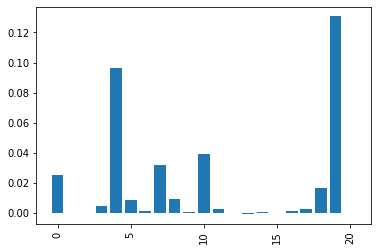

In [58]:
feature_importance_permutation(dataframe=df,features=cols,target='Churn',model=KNeighborsClassifier())

Feature Importances :  [0.01214603 0.11242706 0.29439315 0.02743802 0.02059815 0.01645027
 0.01989309 0.01634579 0.01016167 0.01495383 0.01223287 0.01310044
 0.01272779 0.01179153 0.05562021 0.0480813  0.10880516 0.1612495
 0.01364711 0.0129221  0.00501487]


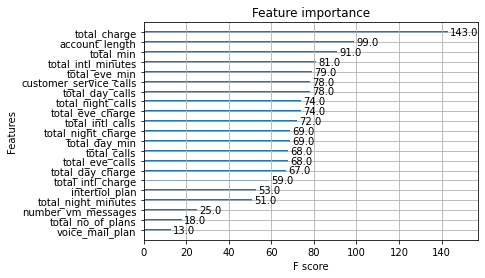

In [59]:
from xgboost import XGBClassifier
from xgboost import plot_importance

# fit model to training data
xgb_model = XGBClassifier(random_state = 0 )
xgb_model.fit(df[cols], df['Churn'])

print("Feature Importances : ", xgb_model.feature_importances_)

# plot feature importance
plot_importance(xgb_model)
plt.show()

In [60]:
X= df[cols]
y = df['Churn']

In [61]:
from sklearn.inspection import permutation_importance

forest = RandomForestClassifier(random_state=0)
forest.fit(X,y)
result = permutation_importance(
    forest,X, y, n_repeats=10, random_state=42, n_jobs=2,scoring='accuracy'
)



forest_importances = pd.Series(result.importances_mean, index=cols)

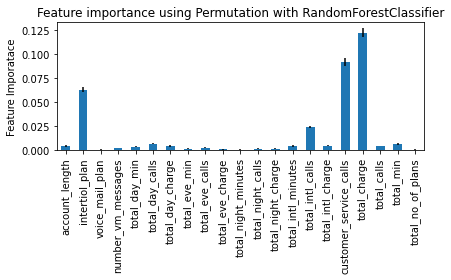

In [62]:
fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=result.importances_std, ax=ax)
ax.set_title("Feature importance using Permutation with RandomForestClassifier")
ax.set_ylabel("Feature Imporatace")
fig.tight_layout()
plt.show()

KeyboardInterrupt: 

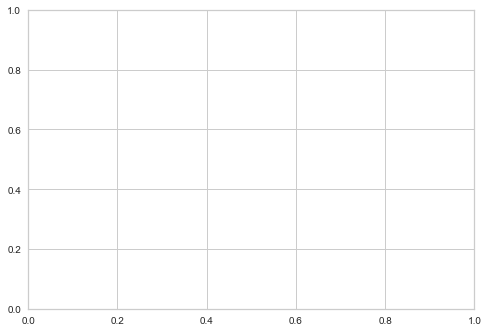

In [63]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import StratifiedKFold

from yellowbrick.model_selection import rfecv


cv = StratifiedKFold(5)
visualizer = rfecv(RandomForestClassifier(), X=X, y=y, cv=cv, scoring='f1_weighted')

In [64]:
df.head()

,customer_id,account_length,location_code,intertiol_plan,voice_mail_plan,number_vm_messages,total_day_min,total_day_calls,total_day_charge,total_eve_min,...,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,customer_service_calls,Churn,total_charge,total_calls,total_min,total_no_of_plans
0,1001,15.0,452,0,0,0.0,121.1,130.0,20.59,216.0,...,10.58,16.1,5.0,4.35,2.0,0,53.88,254.0,588.3,0
1,1002,105.0,452,0,0,0.0,259.3,96.0,44.08,175.2,...,10.01,12.0,5.0,3.24,3.0,0,72.22,234.0,668.9,0
2,1003,97.0,452,0,1,32.0,183.4,94.0,31.18,269.1,...,9.16,6.7,4.0,1.81,5.0,0,65.02,256.0,662.7,1
3,1004,121.0,445,0,1,35.0,68.7,95.0,11.68,209.2,...,8.88,11.4,4.0,3.08,1.0,0,41.42,210.0,486.7,1
4,1005,98.0,452,0,1,22.0,278.3,89.0,47.31,93.4,...,4.84,9.7,5.0,2.62,0.0,0,62.71,279.0,489.0,1


<AxesSubplot:xlabel='total_no_of_plans', ylabel='count'>

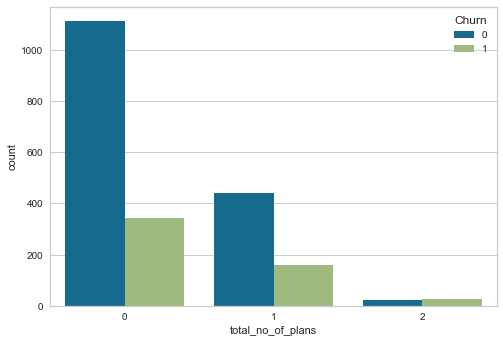

In [65]:
sns.countplot(x="total_no_of_plans", hue="Churn", data=df)

In [66]:
df[['total_eve_calls','total_intl_calls','total_night_calls','total_day_calls']]

,total_eve_calls,total_intl_calls,total_night_calls,total_day_calls
0,86.0,5.0,33.0,130.0
1,97.0,5.0,36.0,96.0
2,120.0,4.0,38.0,94.0
3,69.0,4.0,42.0,95.0
4,143.0,5.0,42.0,89.0
...,...,...,...,...
2103,103.0,8.0,105.0,100.0
2104,106.0,3.0,105.0,114.0
2105,105.0,5.0,105.0,88.0
2106,88.0,1.0,105.0,130.0


In [71]:
data = {
    'mean_call': [df['total_day_calls'].mean(), df['total_eve_calls'].mean(), df['total_night_calls'].mean(), df['total_intl_calls'].mean()],
    'mean_mins': [df['total_day_min'].mean(),df['total_eve_min'].mean(), df['total_night_minutes'].mean(), df['total_intl_minutes'].mean()]
    }

calls_df_mean = pd.DataFrame(data, index=['day','eve','night','intl'])

In [72]:
data

{'mean_call': [100.87268408551068,
  100.10308788598574,
  87.67998097955302,
  4.410926365795724],
 'mean_mins': [183.33179876601804,
  202.03781472684088,
  201.24349477682807,
  10.25099715099715]}

In [73]:
calls_df_mean

,mean_call,mean_mins
day,100.872684,183.331799
eve,100.103088,202.037815
night,87.679981,201.243495
intl,4.410926,10.250997


In [74]:
calls_df_mean['mean_avg_mins_for_call'] = calls_df_mean['mean_mins']/calls_df_mean['mean_call']
calls_df_mean

,mean_call,mean_mins,mean_avg_mins_for_call
day,100.872684,183.331799,1.817457
eve,100.103088,202.037815,2.018298
night,87.679981,201.243495,2.295205
intl,4.410926,10.250997,2.324001


Text(0.5, 1.0, 'No.of avg calls taken by customer vs call catergory')

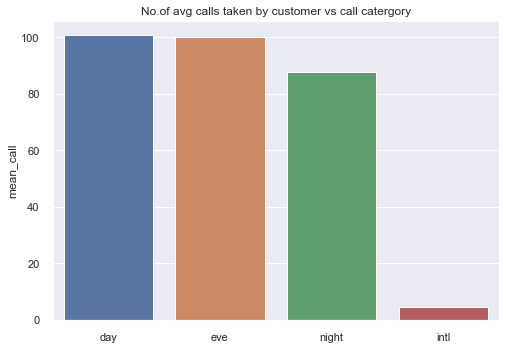

In [82]:
sns.set()
sns.barplot(x=calls_df_mean.index,y=calls_df_mean.mean_call)
# plt.settitle("No.of calls taken by customer vs type of call")
plt.title("No.of avg calls taken by customer vs call catergory")

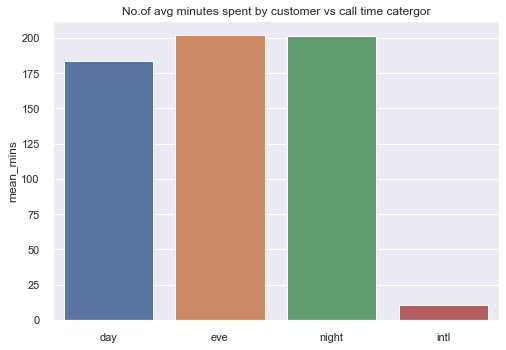

In [77]:
sns.set()
sns.barplot(x=calls_df_mean.index,y=calls_df_mean.mean_mins)
# plt.settitle("No.of calls taken by customer vs type of call")
plt.title("No.of avg minutes spent by customer vs call catergor")
plt.show()

In [78]:
churn_df = df[df.Churn == 1]
churn_data = {
    'mean_call': [df['total_day_calls'].mean(), df['total_eve_calls'].mean(), df['total_night_calls'].mean(), df['total_intl_calls'].mean()],
    'mean_mins': [df['total_day_min'].mean(),df['total_eve_min'].mean(), df['total_night_minutes'].mean(), df['total_intl_minutes'].mean()]
    }

churn_call_mean_df = pd.DataFrame(churn_data, index=['day','eve','night','intl'])
churn_call_mean_df

,mean_call,mean_mins
day,100.872684,183.331799
eve,100.103088,202.037815
night,87.679981,201.243495
intl,4.410926,10.250997


Text(0.5, 1.0, 'No.of calls taken by existing customer vs type of call')

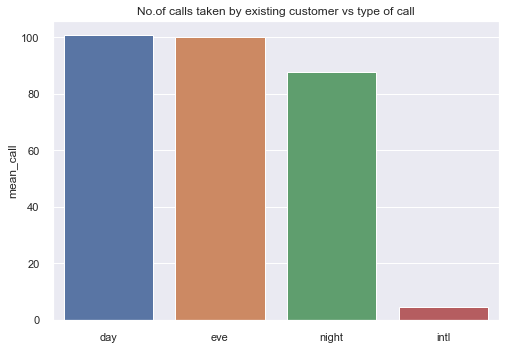

In [81]:
sns.set()
sns.barplot(x=churn_call_mean_df.index,y=churn_call_mean_df.mean_call)
# plt.settitle("No.of calls taken by customer vs type of call")
plt.title("No.of calls taken by existing customer vs type of call")